### Laboratorium 5 - część projektowa

W tej części zajmiesz się wykorzystaniem punktów kluczowych do łączenia obrazów (_image stitching_). Celem zadania jest przetestowanie możliwości detekcji i parowania punktów kluczowych w celu łączenia obrazów. Istotne jest, by samodzielnie przejść całą ścieżkę: od detekcji punktów kluczowych i wyznaczenia ich desktryptorów, przez ich parowanie i znalezienie transformacji, po finalne połączenie obrazów. Rozwiązania oparte o gotowce w stylu black-box nie będą oceniane.

Wykonaj serię zdjęć dowolnej wybranej przez siebie **statycznej** sceny. Może to być niemal dowolny widok o dowolnej skali: panorama miasta, swojego pokoju, powierzchni biurka - ważne, by pozyskane obrazy umożliwiały (1) użycie algorytmu SIFT, oraz (2) wykonanie transformacji geometrycznej. (Ta część zadania wymaga zrozumienia teoretycznych podstaw zagadnienia; jeśli źle wykonasz zdjęcia, dalsze wyniki również będą słabe.)

Wykonaj 4-5 zdjęć, spośród których pierwsze (nazwij je `base`) niech przedstawia \"główny\" widok sceny, a pozostałe (o nazwie `offset_{index}`) niech cechują się coraz większym przesunięciem kamery względem `base`. Proponowane różnice:
* nieznaczne przesunięcie (o ~połowę szerokości klatki),
* większe przesunięcie (o 3/4 szerokości lub więcej),
* przesunięcie z rotacją w osi kamery,
* (jeśli to możliwe) przybliżenie/oddalenie kamery.

Wykorzystaj algorytmy opracowane do realizacji zadania 3 (zwłaszcza 3b) w celu przekształcania obrazów `offset_x` do geometrii `base`. Upewnij się, że wymiary wynikowych obrazów są wystarczające do zmieszczenia obu składowych.

*Czy każdą parę `offset_i`-`base` udało się połączyć? Jeśli dla którejś pary metoda zawiodła, to dlaczego?*  
*Jaka była jakość dopasowania? Na jakiej podstawie ją określasz?*

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path
import glob

from lab5.project_utils import stitch_images, create_panorama
from lab5.research_utils import match_and_analyze_sift, locate_object_with_homography

### base image

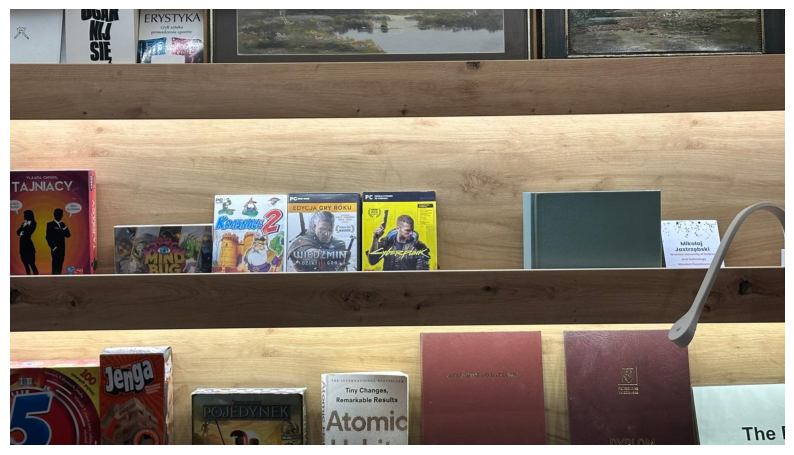

In [2]:
base: np.ndarray = cv2.imread("lab5/zdjecia/base.jpeg")[:, :, ::-1]
plt.figure(figsize=(10, 10))
plt.imshow(base)
plt.axis("off")
plt.show()

### przykładowy obrazek `offset_1`

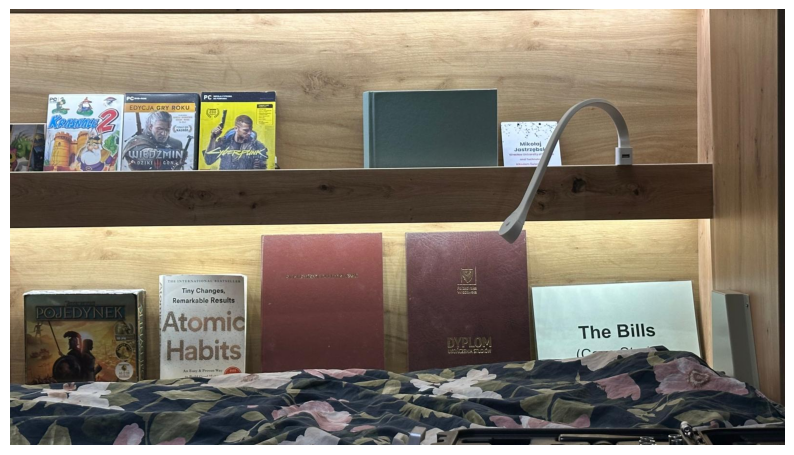

In [3]:
offset_1: np.ndarray = cv2.imread("lab5/zdjecia/offset_1.jpeg")[:, :, ::-1]
plt.figure(figsize=(10, 10))
plt.imshow(offset_1)
plt.axis("off")
plt.show()

### przykładowy obrazek `rot_1` (rotacja i przybliżenie)

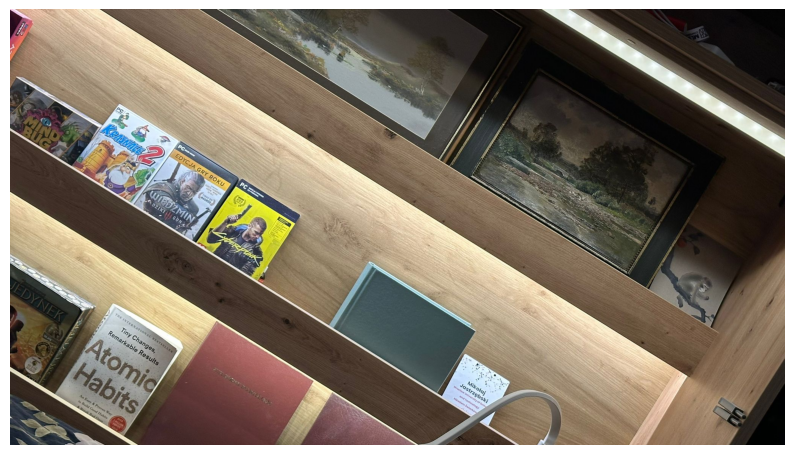

In [4]:
rot_1: np.ndarray = cv2.imread("lab5/zdjecia/rot_1.jpeg")[:, :, ::-1]
plt.figure(figsize=(10, 10))
plt.imshow(rot_1)
plt.axis("off")
plt.show()

### Analiza przed łączeniem

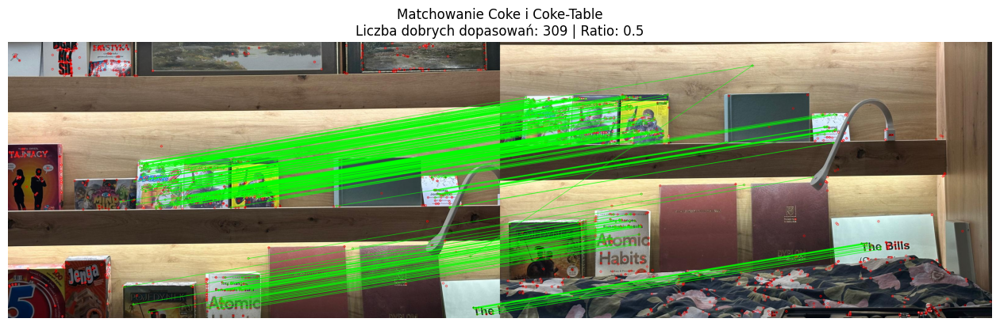

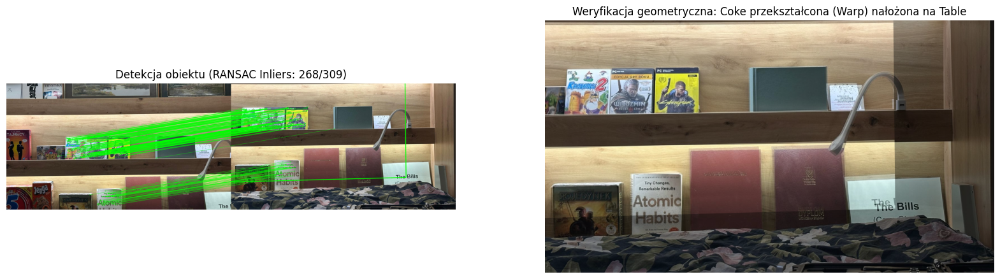

In [5]:
kp_c, kp_t, good_matches = match_and_analyze_sift(
    base[:, :, ::-1],
    offset_1[:, :, ::-1],
    sift_params={"contrastThreshold": 0.1, "edgeThreshold": 5},
    title="Matchowanie Coke i Coke-Table",
    ratio_thresh=0.5,
    knn=2,
    visualize=True,
)
locate_object_with_homography(
    base[:, :, ::-1], offset_1[:, :, ::-1], kp_c, kp_t, good_matches, method=0
)

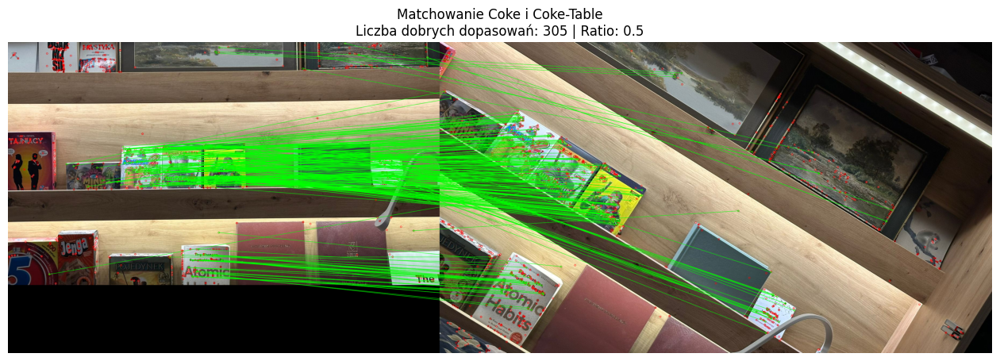

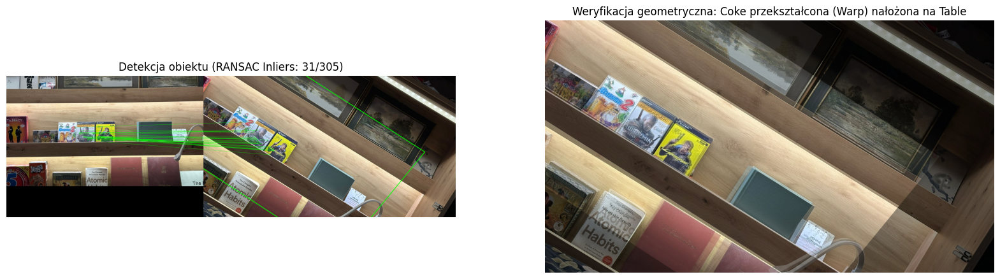

In [6]:
kp_c, kp_t, good_matches = match_and_analyze_sift(
    base[:, :, ::-1],
    rot_1[:, :, ::-1],
    sift_params={"contrastThreshold": 0.1, "edgeThreshold": 5},
    title="Matchowanie Coke i Coke-Table",
    ratio_thresh=0.5,
    knn=2,
    visualize=True,
)
locate_object_with_homography(
    base[:, :, ::-1], rot_1[:, :, ::-1], kp_c, kp_t, good_matches, method=0
)

### próba połączenia obrazków `base` i `offset`

In [7]:
BASE_DIR = Path("lab5/zdjecia")

Znaleziono 7 plików offset.


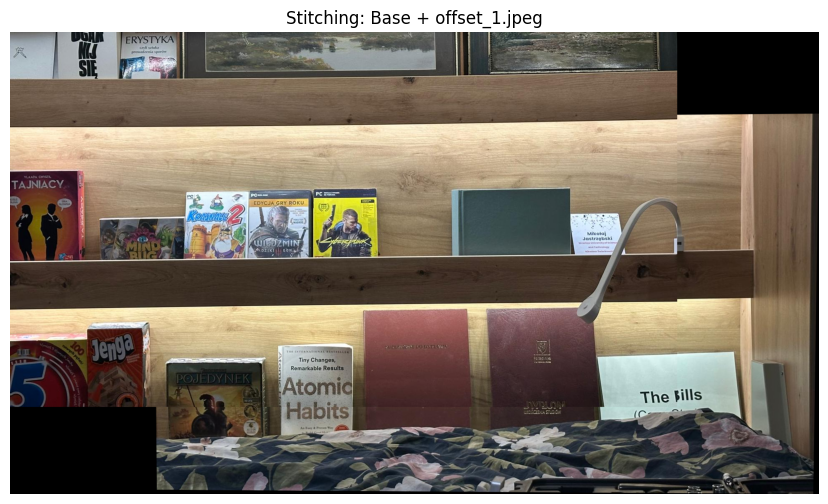

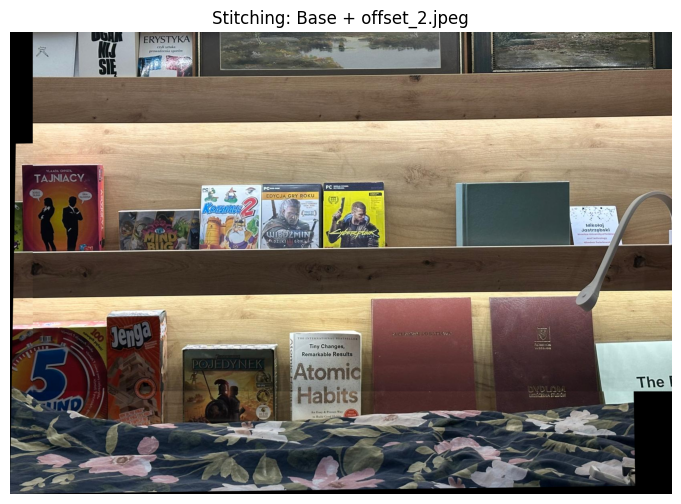

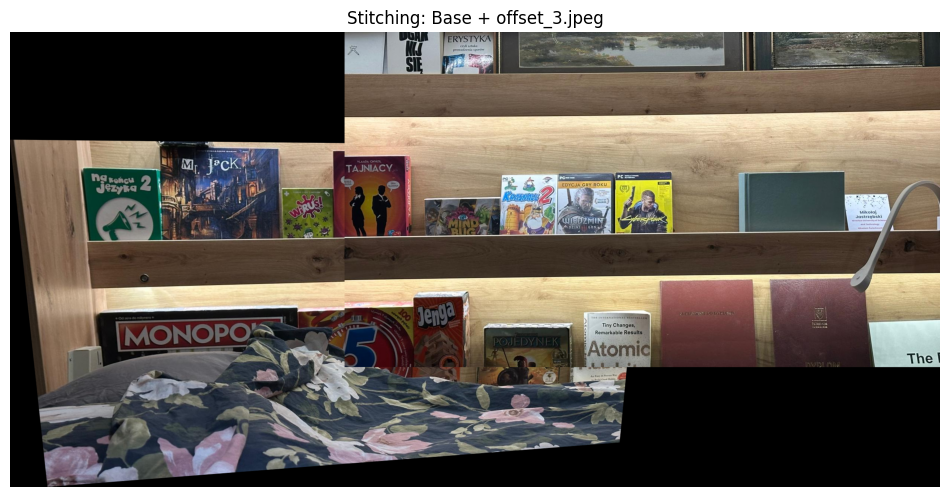

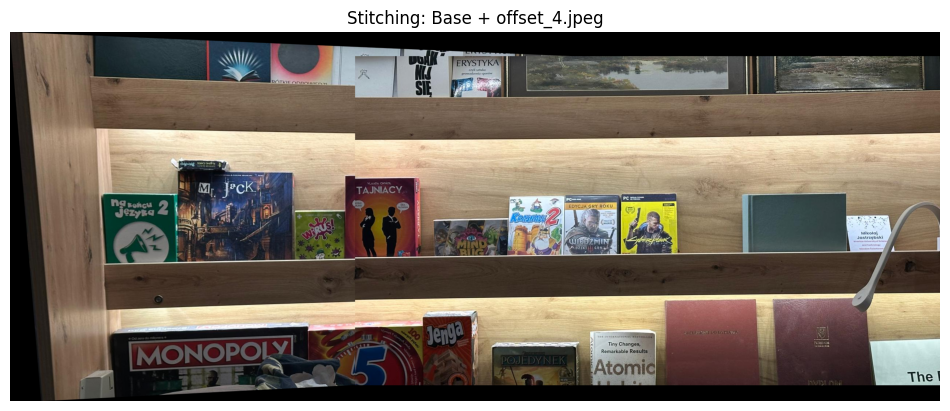

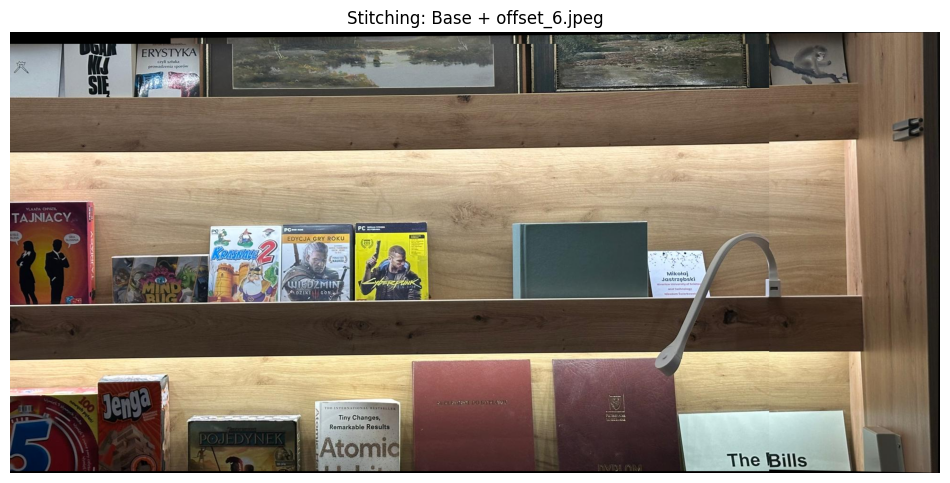

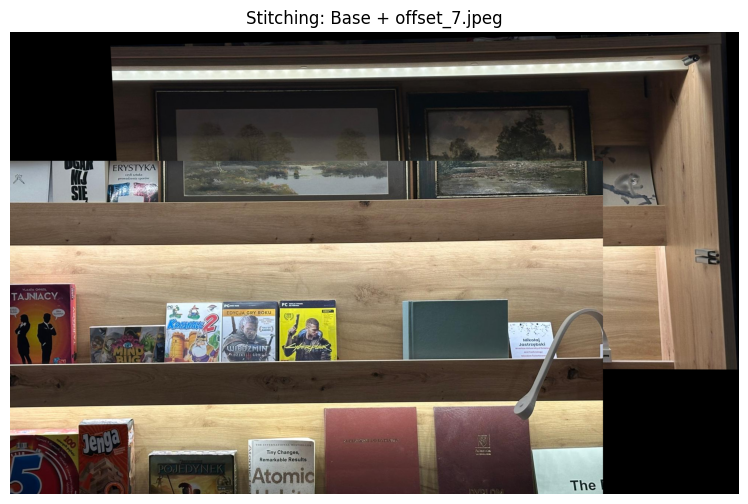

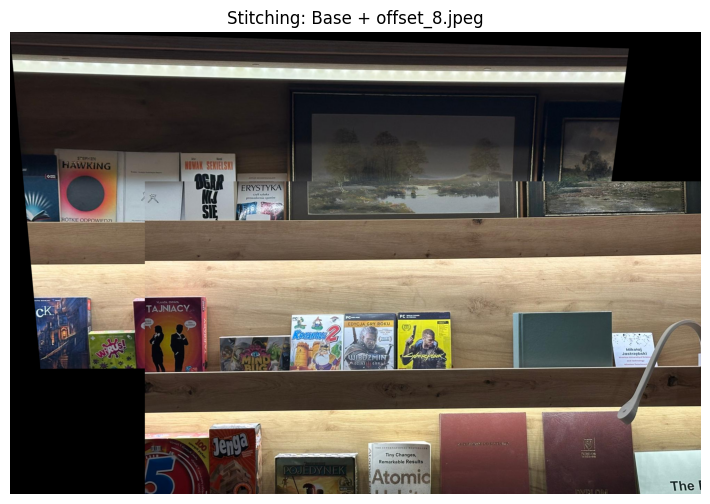

In [8]:
path_base = BASE_DIR / "base.jpeg"
img_base = cv2.imread(str(path_base))
offset_files = sorted(glob.glob(str(BASE_DIR / "offset_*.jpeg")))
print(f"Znaleziono {len(offset_files)} plików offset.")

for path_offset in offset_files:
    filename = os.path.basename(path_offset)
    img_offset = cv2.imread(path_offset)
    result = stitch_images(img_base, img_offset)

    if result is not None:
        plt.figure(figsize=(12, 6))
        plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        plt.title(f"Stitching: Base + {filename}")
        plt.axis("off")
        plt.show()

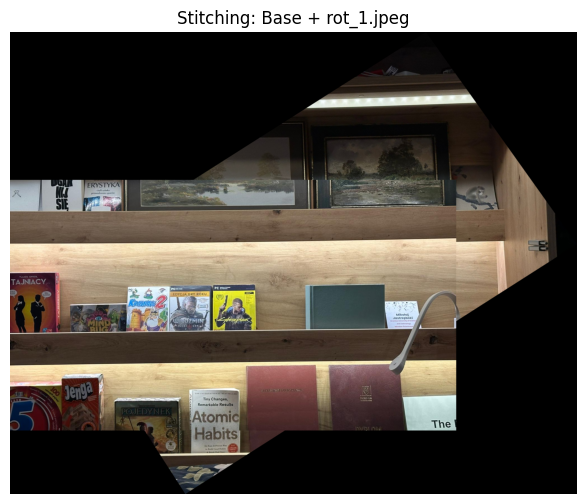

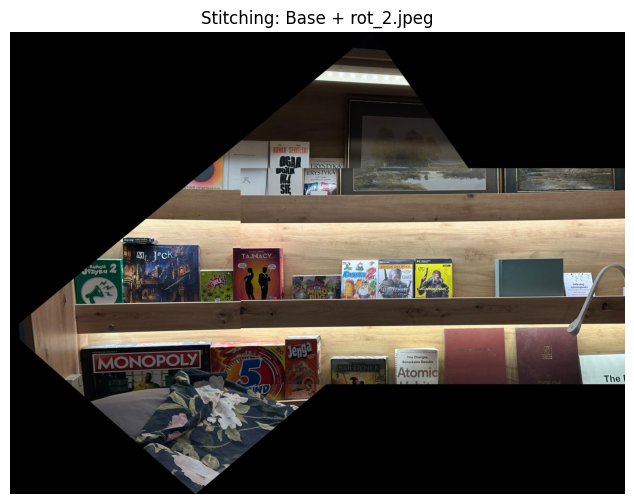

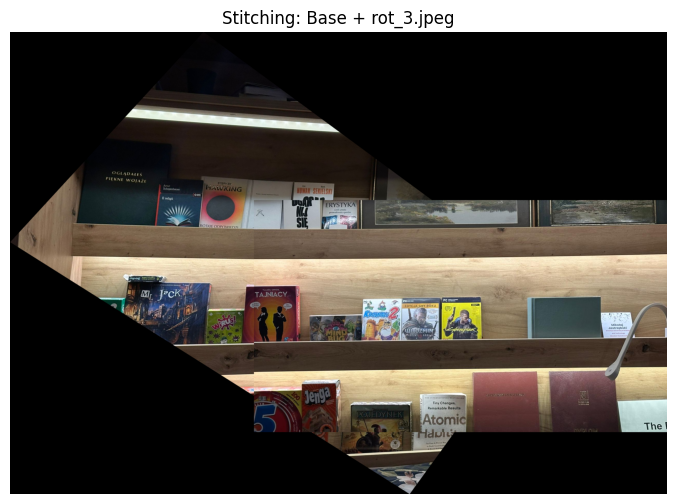

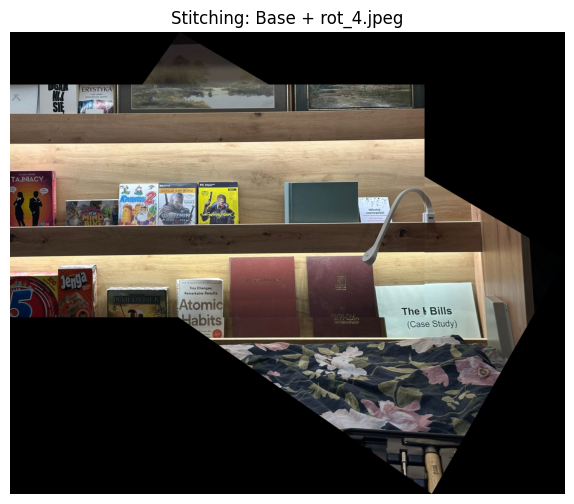

In [9]:
path_base = BASE_DIR / "base.jpeg"
img_base = cv2.imread(str(path_base))
offset_files = sorted(glob.glob(str(BASE_DIR / "rot_*.jpeg")))


for path_offset in offset_files:
    filename = os.path.basename(path_offset)
    img_offset = cv2.imread(path_offset)
    result = stitch_images(img_base, img_offset)

    if result is not None:
        plt.figure(figsize=(12, 6))
        plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
        plt.title(f"Stitching: Base + {filename}")
        plt.axis("off")
        plt.show()

Znaleziono 7 dodatkowych obrazów do połączenia.


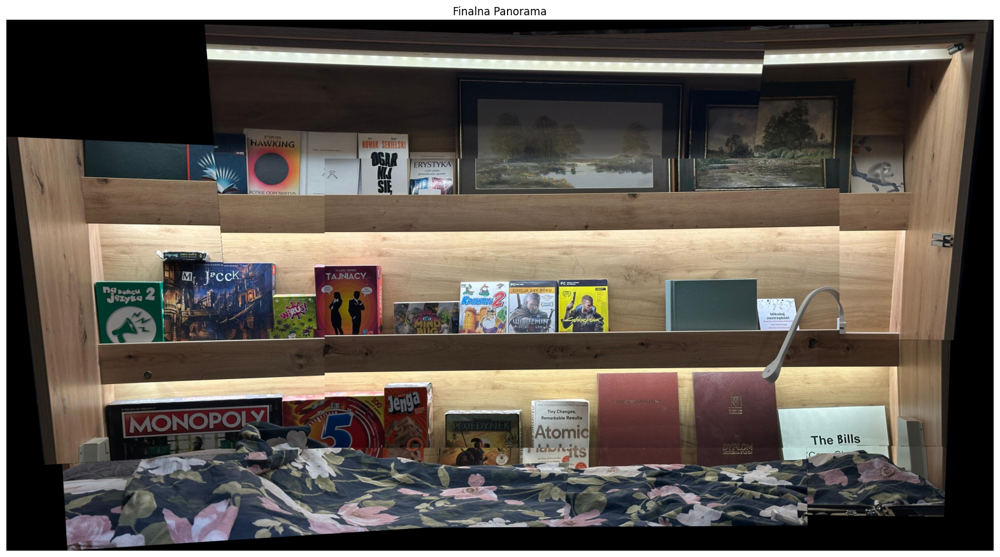

In [10]:
base_file = os.path.join(BASE_DIR, "base.jpeg")
search_pattern = os.path.join(BASE_DIR, "offset_*.jpeg")

final_result = create_panorama(base_file, search_pattern)

if final_result is not None:
    output_path = os.path.join(BASE_DIR, "final_panorama_offset.jpg")
    cv2.imwrite(output_path, final_result)

    plt.figure(figsize=(20, 12))
    plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
    plt.title("Finalna Panorama")
    plt.axis("off")
    plt.show()

Znaleziono 4 dodatkowych obrazów do połączenia.


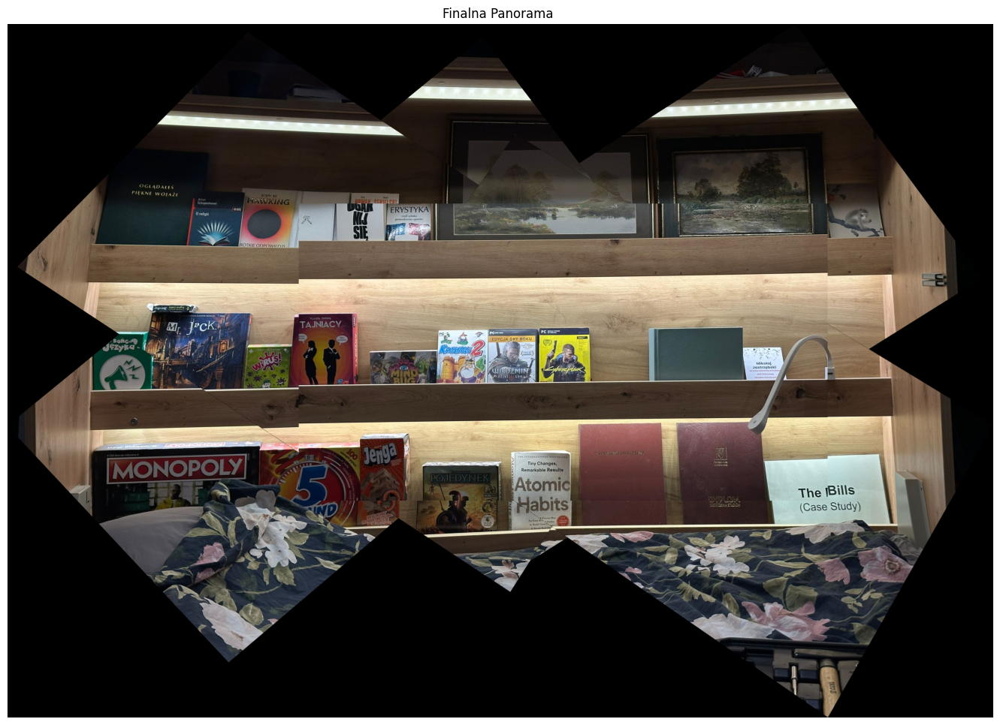

In [11]:
base_file = os.path.join(BASE_DIR, "base.jpeg")
search_pattern = os.path.join(BASE_DIR, "rot_*.jpeg")

final_result = create_panorama(base_file, search_pattern)

if final_result is not None:
    output_path = os.path.join(BASE_DIR, "final_panorama_rot.jpg")
    cv2.imwrite(output_path, final_result)

    plt.figure(figsize=(20, 12))
    plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
    plt.title("Finalna Panorama ")
    plt.axis("off")
    plt.show()

Znaleziono 8 dodatkowych obrazów do połączenia.


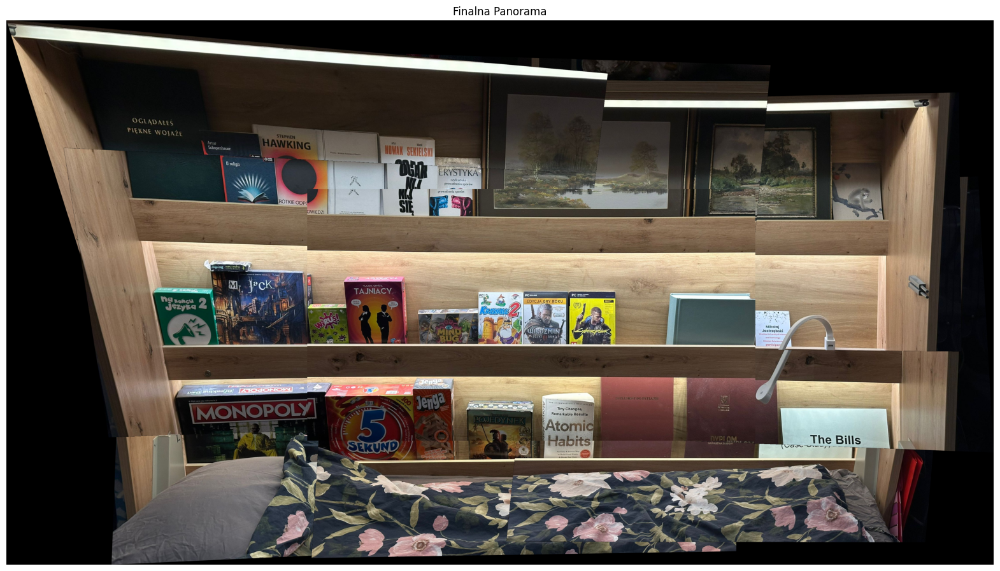

In [14]:
BAD_DIR = Path("lab5/zdjecia_kiepskie")
base_file = os.path.join(BAD_DIR, "base.jpeg")
search_pattern = os.path.join(BAD_DIR, "offset_*.jpeg")

final_result = create_panorama(base_file, search_pattern)

if final_result is not None:
    output_path = os.path.join(BAD_DIR, "final_panorama_offset.jpg")
    cv2.imwrite(output_path, final_result)

    plt.figure(figsize=(20, 12))
    plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
    plt.title("Finalna Panorama")
    plt.axis("off")
    plt.show()

Znaleziono 4 dodatkowych obrazów do połączenia.


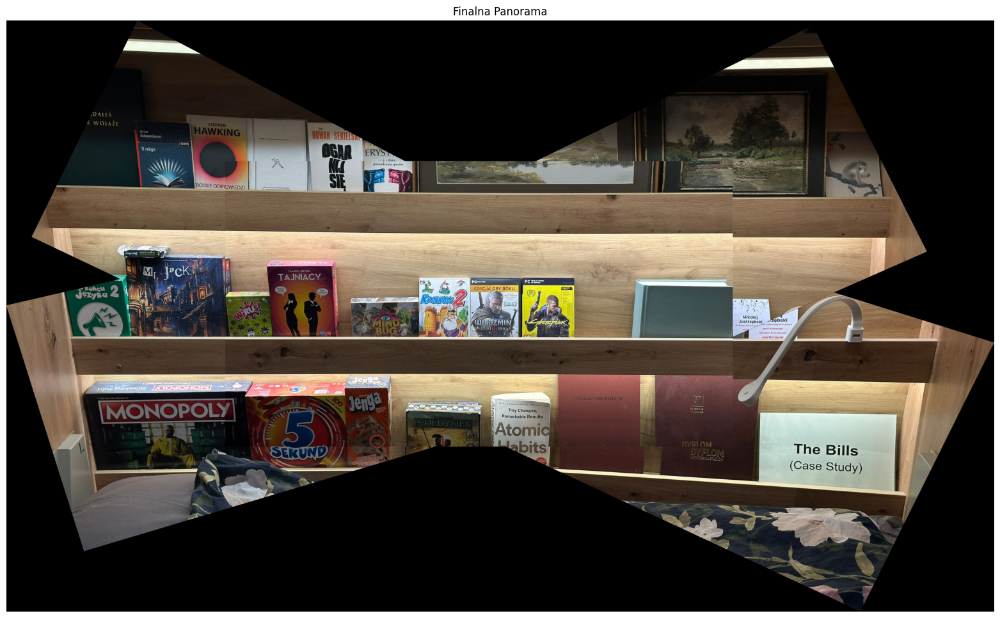

In [15]:
BAD_DIR = Path("lab5/zdjecia_kiepskie")
base_file = os.path.join(BAD_DIR, "base.jpeg")
search_pattern = os.path.join(BAD_DIR, "rot_*.jpeg")

final_result = create_panorama(base_file, search_pattern)

if final_result is not None:
    output_path = os.path.join(BAD_DIR, "final_panorama_rot.jpg")
    cv2.imwrite(output_path, final_result)

    plt.figure(figsize=(20, 12))
    plt.imshow(cv2.cvtColor(final_result, cv2.COLOR_BGR2RGB))
    plt.title("Finalna Panorama")
    plt.axis("off")
    plt.show()